In [1]:
import os
import pandas as pd
import numpy as np
from PIL import Image
from tqdm import tqdm 
from skimage.color import rgb2lab, lab2rgb
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data.sampler import SubsetRandomSampler
from torch.utils.data import Dataset,DataLoader
import torchvision.transforms as transforms
import warnings

In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

print(device)

cuda:0


## Data Loading & preprocessing

In [3]:
os.listdir("/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba")[0]

'083648.jpg'

In [4]:
BASE_PATH = '/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/'

# Creating a dataframe for indexing images

image=[]
size=[]
count = 0

for c in tqdm(os.listdir(BASE_PATH), desc="Processing Images"):
    if count < 10000:
        image.append(c)
        size.append(np.array(Image.open(os.path.join(BASE_PATH, c))).shape)
    else:
        break
    count += 1
    
data = {'Images':image, 'Size':size} 
data = pd.DataFrame(data) 
data.head()

Processing Images:   5%|▍         | 10000/202599 [00:55<17:56, 178.88it/s]


,Images,Size
0,083648.jpg,"(218, 178, 3)"
1,168202.jpg,"(218, 178, 3)"
2,125778.jpg,"(218, 178, 3)"
3,059339.jpg,"(218, 178, 3)"
4,032501.jpg,"(218, 178, 3)"


In [5]:
data.shape

(10000, 2)

In [6]:
batch_size = 16
validation_split = 0.2
shuffle_dataset = True
random_seed= 42

In [7]:
indices = list(range(len(data)))
split = int(np.floor(validation_split * len(data)))
if shuffle_dataset :
    np.random.seed(random_seed)
    np.random.shuffle(indices)
train_indices, val_indices = indices[split:], indices[:split]

train_sampler = SubsetRandomSampler(train_indices)
validation_sampler = SubsetRandomSampler(val_indices)

## Dataset Loader

In [8]:
class imageDataset(Dataset):
    def __init__(self,imgdata,basepath,transform=None):
        self.imgdata=imgdata
        self.basepath=basepath
        self.transform=transform

    def __len__(self):
        return len(selfimgdata)
    def __getitem__(self, index):
        img_name = os.path.join(self.basepath, self.imgdata.loc[index, 'Images'])
        img = Image.open(img_name).convert("RGB")
        if self.transform is not None:
            img = self.transform(img)
        img = np.array(img)
        
        rgb_img = transforms.ToTensor()(img)
        
        img_lab = rgb2lab(img).astype("float32")
        img_lab = transforms.ToTensor()(img_lab)

        L = img_lab[[0], ...] / 50. - 1. # Between -1 and 1
        ab = img_lab[[1, 2], ...] / 110. # Between -1 and 1

        return L, ab, rgb_img

In [9]:
dataset = imageDataset(data, BASE_PATH, transform = transforms.Resize((256, 256),  Image.BICUBIC))

train_loader = DataLoader(dataset, batch_size=batch_size, sampler=train_sampler)
validation_loader =DataLoader(dataset, batch_size=batch_size, sampler=validation_sampler)

## Test and Train dataset

In [10]:
def display_L_channel(L):
    L = (L+1.)*50.
    z = np.zeros((L.shape[1], L.shape[2], 3))
    z[:,:,0] = L[0,:,:]
    z = lab2rgb(z)
    return(z)

def display_rgb_img(img):
    img = img  # unnormalize
    npimg = img.numpy()
    npimg = np.transpose(npimg, (1, 2, 0))
    return npimg

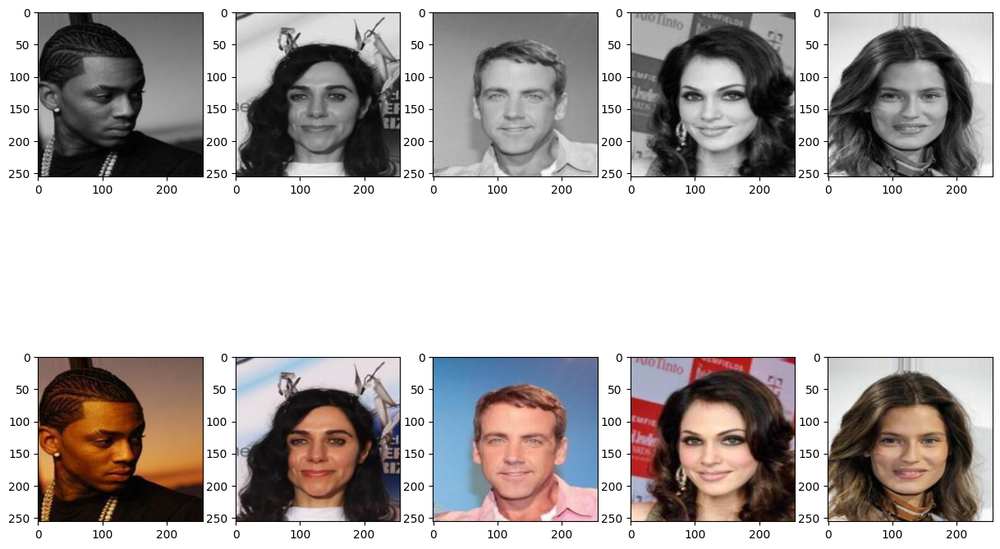

In [11]:
# get some random training images
dataiter = iter(train_loader)
lab_img_L, lab_img_ab, RGB_img = next(dataiter)

plt.figure(figsize=(15, 10))
for i in range(1, 6):
    with torch.no_grad():
        L = lab_img_L[i]
        ab = lab_img_ab[i]
        RGB = RGB_img[i]
        
        plt.subplot(2, 5, i)
        plt.imshow(display_L_channel(L)) 
        # plt.title(f"{i}")
        
        plt.subplot(2, 5, i + 5)
        plt.imshow(display_rgb_img(RGB)) 
        # plt.title(f"{i + 5}")

## Generator(UNet Block)

In [12]:
## Down Sampling Block
class down_block(nn.Module):
    def __init__(self, in_channels, out_channels, norm=True, act="leaky_relu", use_dropout=False):
        super(down_block, self).__init__()
        layers = []
        
        # Convolution Layers, output is approx half size due to stride = 2, didnt use MaxPooling here
        layers += [nn.Conv2d(in_channels, out_channels, kernel_size = 4, stride = 2, padding = 1, bias=False)]
        
        # BatchNorm, will be turned off for input down block
        if norm: layers += [nn.BatchNorm2d(out_channels)]
            
        # Two options for ReLU activation, LeakyReLU default for down block
        if act == "leaky_relu":  layers += [nn.LeakyReLU(0.2, inplace=True)]
        elif act == "relu": layers += [nn.ReLU(inplace=True)]
            
        if use_dropout: layers += [nn.Dropout(0.5)]
        
        self.conv = nn.Sequential(*layers)
        
        
    def forward(self, x):
        x = self.conv(x)
        return x
        
## Up sampling Block
        
class up_block(nn.Module):
    def __init__(self, in_channels, out_channels, norm=True, act="relu", use_dropout=False):
        super(up_block, self).__init__()
        layers = []
        
        # Two options for ReLU activation, LeakyReLU default for down block
        if act == "leaky_relu":  layers += [nn.LeakyReLU(0.2, inplace=True)]
        elif act == "relu": layers += [nn.ReLU(inplace=True)]
        
        # ConvTranspose2D 
        layers += [nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 4, stride = 2, padding = 1, bias=False)]
        
        # BatchNorm, will be turned off for output up block
        if norm: layers += [nn.BatchNorm2d(out_channels)]
            
        if use_dropout: layers += [nn.Dropout(0.5)]
            
        self.conv = nn.Sequential(*layers)
        
    def forward(self, x):
        x = self.conv(x)
        return x
        

In [13]:
class Unet(nn.Module):
    def __init__(self, in_channels=1, num_filters=64):
        super().__init__()
        # Down Sampling 
        self.input_down = down_block(in_channels = in_channels, out_channels = num_filters, norm=False) # norm=False for input down block
        
        self.down1 = down_block(in_channels = num_filters, out_channels = num_filters*2)
        self.down2 = down_block(in_channels = num_filters*2, out_channels = num_filters*4)
        self.down3 = down_block(in_channels = num_filters*4, out_channels = num_filters*8)
        
        self.down4 = down_block(in_channels = num_filters*8, out_channels = num_filters*8)
        self.down5 = down_block(in_channels = num_filters*8, out_channels = num_filters*8)
        self.down6 = down_block(in_channels = num_filters*8, out_channels = num_filters*8)
        
        # Bottleneck 
        
        self.bottleneck = nn.Sequential(
            nn.Conv2d(in_channels = num_filters*8, out_channels = num_filters*8, kernel_size = 4, stride = 2, padding = 1, bias=False),
            up_block(in_channels = num_filters*8, out_channels = num_filters*8)
        )
        
        # Up Sampling
        
        self.up1 = up_block(in_channels = num_filters*8*2, out_channels = num_filters*8, use_dropout=True)
        self.up2 = up_block(in_channels = num_filters*8*2, out_channels = num_filters*8, use_dropout=True)
        self.up3 = up_block(in_channels = num_filters*8*2, out_channels = num_filters*8, use_dropout=True)
        
        self.up4 = up_block(in_channels = num_filters*8*2, out_channels = num_filters*4)
        self.up5 = up_block(in_channels = num_filters*4*2, out_channels = num_filters*2)
        self.up6 = up_block(in_channels = num_filters*2*2, out_channels = num_filters)
        
        self.output_up = nn.Sequential(
            up_block(in_channels = num_filters*2, out_channels = in_channels*2, norm=False), 
            nn.Tanh()
        )
        
    def forward(self, x):
        d1 = self.input_down(x)
        d2 = self.down1(d1)
        d3 = self.down2(d2)
        d4 = self.down3(d3)
        d5 = self.down4(d4)
        d6 = self.down5(d5)
        d7 = self.down6(d6)
        bottleneck = self.bottleneck(d7)
        up1 = self.up1(torch.cat([bottleneck, d7], 1))
        up2 = self.up2(torch.cat([up1, d6], 1))
        up3 = self.up3(torch.cat([up2, d5], 1))
        up4 = self.up4(torch.cat([up3, d4], 1))
        up5 = self.up5(torch.cat([up4, d3], 1))
        up6 = self.up6(torch.cat([up5, d2], 1))
        output = self.output_up(torch.cat([up6, d1], 1))
        
        return output

In [14]:
Unet()

Unet(
  (input_down): down_block(
    (conv): Sequential(
      (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down1): down_block(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down2): down_block(
    (conv): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down3): down_block(
    (conv): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=Tr

## Discriminator

In [15]:
class PatchDiscriminator(nn.Module):
    def __init__(self, in_channels, num_filters = 64, n_middle = 3):
        super().__init__()
        layers = []
        layers.append(nn.Conv2d(in_channels, num_filters,4, 2, 1, bias = True))
        layers.append(nn.LeakyReLU(0.2, True))

        for i in range(n_middle):
            layers.append(nn.Conv2d(num_filters * 2 ** i, num_filters * 2 ** (i+1), 4, stride = 1 if i == (n_middle - 1) else 2, padding = 1, bias = False))
            layers.append(nn.BatchNorm2d(num_filters * 2 ** (i+1)))
            layers.append(nn.LeakyReLU(0.2, True))
                                 
        layers.append(nn.Conv2d(num_filters * 2 ** n_middle, 1, 4, 1 ,1, bias = True))

        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

## Model Loss

In [16]:
class GANLoss(nn.Module):
    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
#         self.real_label = torch.tensor(real_label)
#         self.fake_label = torch.tensor(fake_label)
        if gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode == 'lsgan':
            self.loss = nn.MSELoss()
    
    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)
    
    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

In [17]:
def init_weights(net, init='norm', gain=0.02):
    
    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            elif init == 'xavier':
                nn.init.xavier_normal_(m.weight.data, gain=gain)
            elif init == 'kaiming':
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')
            
            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)
            
    net.apply(init_func)
    print(f"model initialized with {init} initialization")
    return net

def init_model(model, device):
    model = model.to(device)
    model = init_weights(model)
    return model

## Combining Models

In [18]:
class MainModel(nn.Module):
    def __init__(self, net_G=None, lr_G=2e-4, lr_D=2e-4, 
                 beta1=0.5, beta2=0.999, lambda_L1=100.):
        super().__init__()
        
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_L1 = lambda_L1
        
        if net_G is None:
            self.net_G = init_model(Unet(in_channels=1, num_filters=64), self.device)
        else:
            self.net_G = net_G.to(self.device)
        self.net_D = init_model(PatchDiscriminator(in_channels=3, num_filters = 64, n_middle = 3), self.device)
        self.GANcriterion = GANLoss(gan_mode='vanilla').to(self.device)
        self.L1criterion = nn.L1Loss()
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))
    
    def set_requires_grad(self, model, requires_grad=True):
        for p in model.parameters():
            p.requires_grad = requires_grad
        
    def setup_input(self, data):
        L, ab, rgb_img = data
        self.L = L.to(self.device)
        self.ab = ab.to(self.device)
        
    def forward(self):
        self.fake_color = self.net_G(self.L)
    
    def backward_D(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image.detach())
        self.loss_D_fake = self.GANcriterion(fake_preds, False)
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.net_D(real_image)
        self.loss_D_real = self.GANcriterion(real_preds, True)
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()
    
    def backward_G(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image)
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)
        self.loss_G_L1 = self.L1criterion(self.fake_color, self.ab) * self.lambda_L1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()
    
    def optimize(self):
        self.forward()
        self.net_D.train()
        self.set_requires_grad(self.net_D, True)
        self.opt_D.zero_grad()
        self.backward_D()
        self.opt_D.step()
        
        self.net_G.train()
        self.set_requires_grad(self.net_D, False)
        self.opt_G.zero_grad()
        self.backward_G()
        self.opt_G.step()

In [19]:
class AverageMeter:
    def __init__(self):
        self.reset()
        
    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3
    
    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

def create_loss_meters():
    loss_D_fake = AverageMeter()
    loss_D_real = AverageMeter()
    loss_D = AverageMeter()
    loss_G_GAN = AverageMeter()
    loss_G_L1 = AverageMeter()
    loss_G = AverageMeter()
    
    return {'loss_D_fake': loss_D_fake,
            'loss_D_real': loss_D_real,
            'loss_D': loss_D,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}

def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

def lab_to_rgb(L, ab):
    """
    Converts a batch of LAB images (tensors) to RGB format.
    
    Args:
        L (torch.Tensor): Lightness channel of shape (B, 1, H, W), normalized between [-1, 1]
        ab (torch.Tensor): a and b channels of shape (B, 2, H, W), normalized between [-1, 1]
    
    Returns:
        numpy.ndarray: RGB images as NumPy array with shape (B, H, W, 3), values in [0, 1]
    """
    # Denormalize
    L = (L + 1.) * 50.        
    ab = ab * 110.            

    # Concatenate and reshape
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()  # (B, H, W, 3)

    rgb_imgs = []
    for img in Lab:
        # Clip LAB to valid ranges before conversion
        img[:, :, 0] = np.clip(img[:, :, 0], 0, 100)       
        img[:, :, 1] = np.clip(img[:, :, 1], -128, 127)   
        img[:, :, 2] = np.clip(img[:, :, 2], -128, 127)    

        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            img_rgb = lab2rgb(img)  
        
        rgb_imgs.append(img_rgb)

    return np.stack(rgb_imgs, axis=0)
    
def visualize(model, data, save=True):
    model.net_G.eval()
    with torch.no_grad():
        model.setup_input(data)
        model.forward()
    model.net_G.train()
    fake_color = model.fake_color.detach()
    real_color = model.ab
    L = model.L
    fake_imgs = lab_to_rgb(L, fake_color)
    real_imgs = lab_to_rgb(L, real_color)
    fig = plt.figure(figsize=(15, 8))
    for i in range(5):
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(L[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()
    if save:
        fig.savefig(f"colorization_{time.time()}.png")
        
def log_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

## Training

In [20]:
def train_model(model, train_loader, epochs, display_every=500):
    data = next(iter(validation_loader)) # getting a batch for visualizing the model output after fixed intrvals
    L, ab, rgb_img = data
    for e in range(epochs):
        loss_meter_dict = create_loss_meters() # 
        i = 0                                
        for data in tqdm(train_loader):
            model.setup_input(data) 
            model.optimize()
            update_losses(model, loss_meter_dict, count=L.size(0)) 
            i += 1
            if i % display_every == 0:
                print(f"\nEpoch {e+1}/{epochs}")
                print(f"Iteration {i}/{len(train_loader)}")
                log_results(loss_meter_dict) 
                visualize(model, data, save=False) 
        if (e+1) % 5 == 0:
            torch.save(model.state_dict(), "main_model_epoch_" + str(e) + ".pth")



In [21]:

model = MainModel()
print(model)

model initialized with norm initialization
model initialized with norm initialization
MainModel(
  (net_G): Unet(
    (input_down): down_block(
      (conv): Sequential(
        (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): LeakyReLU(negative_slope=0.2, inplace=True)
      )
    )
    (down1): down_block(
      (conv): Sequential(
        (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.2, inplace=True)
      )
    )
    (down2): down_block(
      (conv): Sequential(
        (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.2, inplace=True)
      )
    )
    (down3): down_block(
      (conv): Sequential(
 

model initialized with norm initialization
model initialized with norm initialization


100%|█████████▉| 499/500 [06:17<00:00,  1.29it/s]


Epoch 1/20
Iteration 500/500
loss_D_fake: 0.54035
loss_D_real: 0.56580
loss_D: 0.55308
loss_G_GAN: 1.29939
loss_G_L1: 7.28148
loss_G: 8.58088


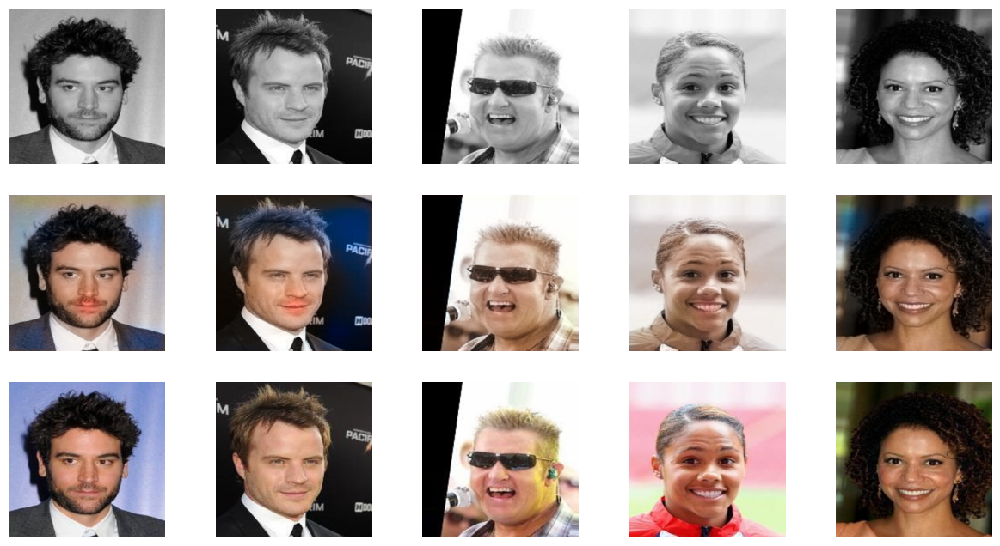

100%|█████████▉| 499/500 [06:29<00:00,  1.30it/s]


Epoch 2/20
Iteration 500/500
loss_D_fake: 0.54364
loss_D_real: 0.58443
loss_D: 0.56403
loss_G_GAN: 1.21199
loss_G_L1: 7.36682
loss_G: 8.57881


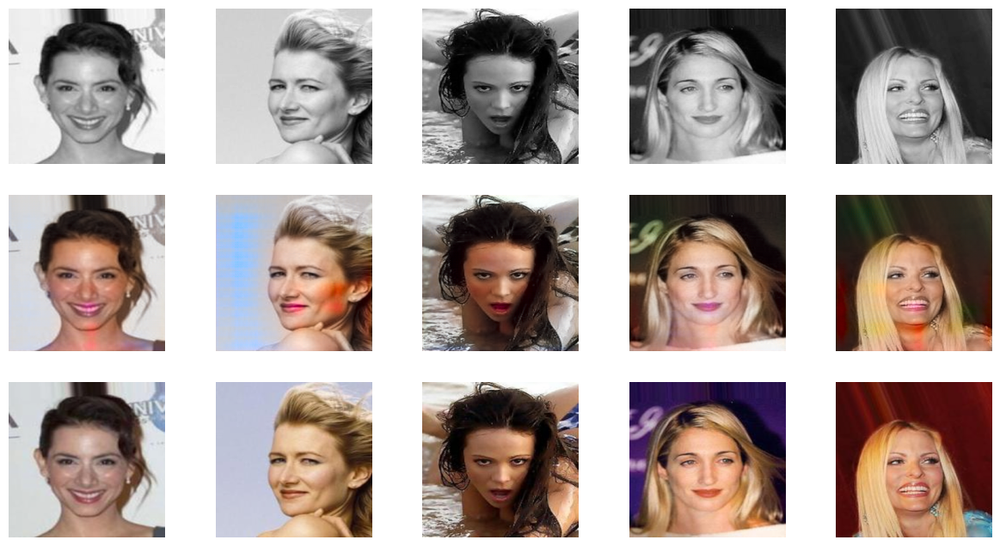

100%|█████████▉| 499/500 [06:28<00:00,  1.29it/s]


Epoch 3/20
Iteration 500/500
loss_D_fake: 0.55468
loss_D_real: 0.59646
loss_D: 0.57557
loss_G_GAN: 1.16689
loss_G_L1: 7.40175
loss_G: 8.56865


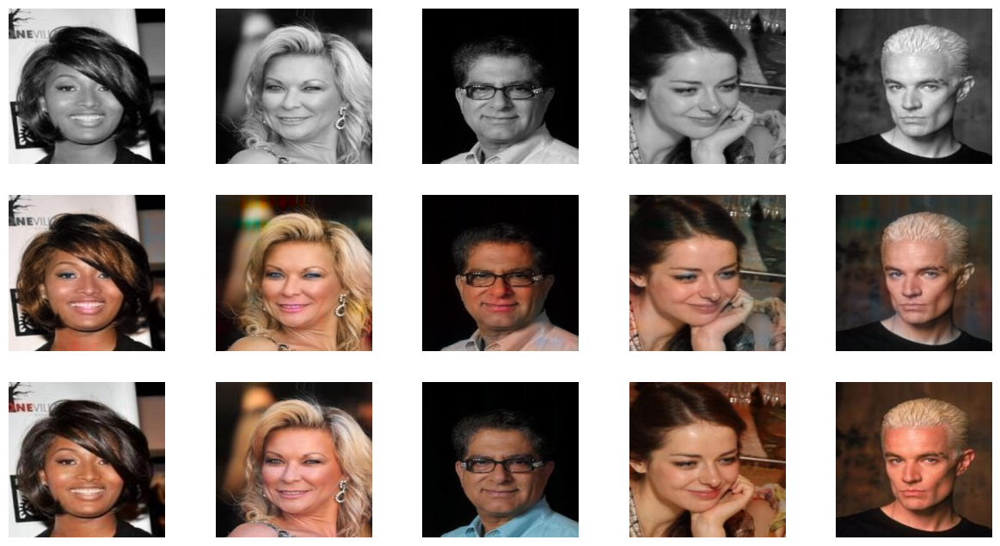

100%|█████████▉| 499/500 [06:27<00:00,  1.28it/s]


Epoch 4/20
Iteration 500/500
loss_D_fake: 0.55355
loss_D_real: 0.60221
loss_D: 0.57788
loss_G_GAN: 1.14527
loss_G_L1: 7.37967
loss_G: 8.52494


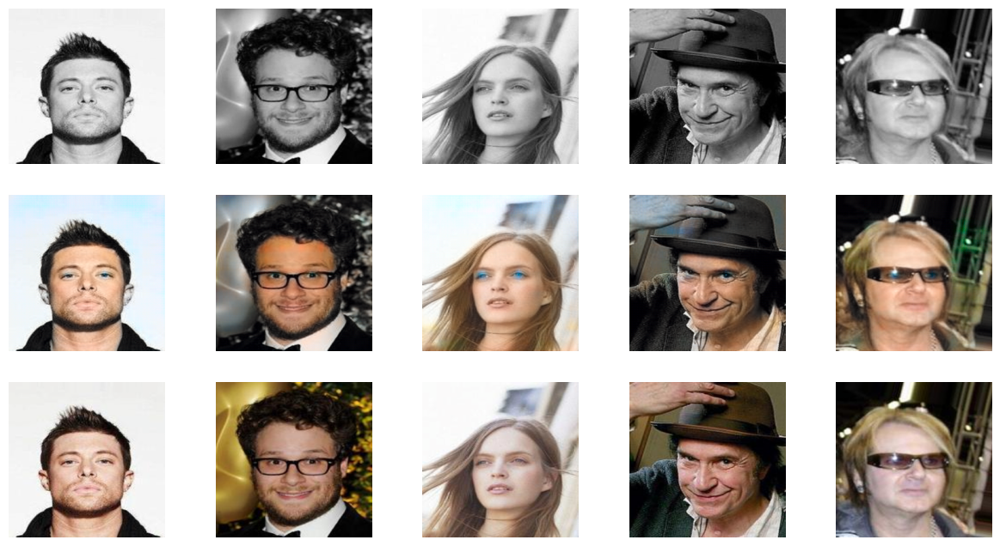

100%|█████████▉| 499/500 [06:27<00:00,  1.29it/s]


Epoch 5/20
Iteration 500/500
loss_D_fake: 0.55017
loss_D_real: 0.60668
loss_D: 0.57843
loss_G_GAN: 1.13904
loss_G_L1: 7.34444
loss_G: 8.48348


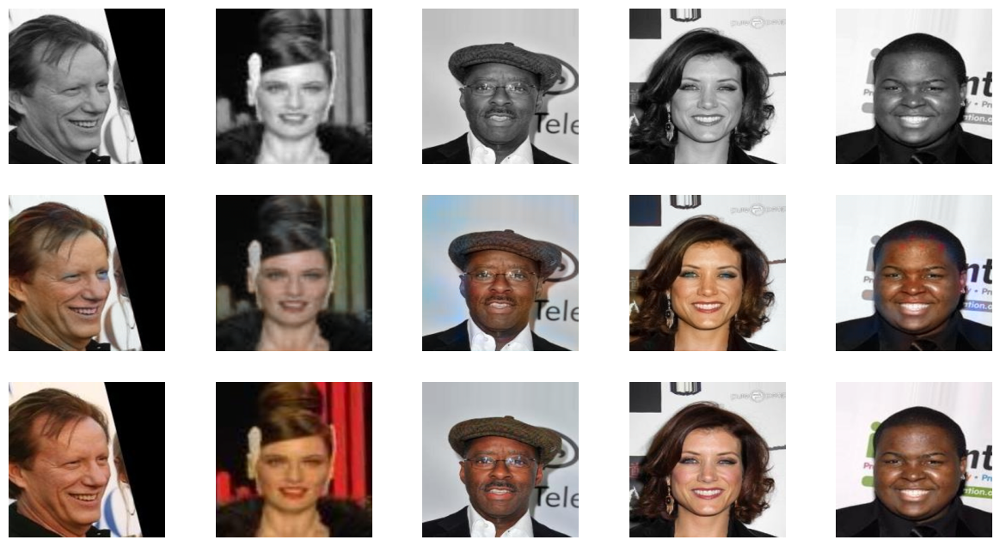

100%|█████████▉| 499/500 [06:27<00:00,  1.30it/s]


Epoch 6/20
Iteration 500/500
loss_D_fake: 0.55681
loss_D_real: 0.60572
loss_D: 0.58127
loss_G_GAN: 1.10848
loss_G_L1: 7.31496
loss_G: 8.42343


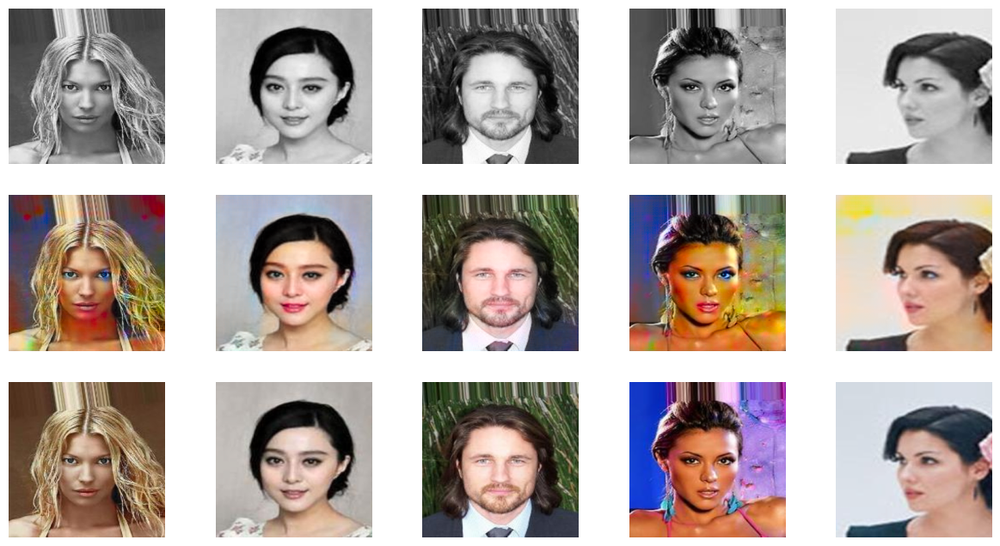

100%|█████████▉| 499/500 [06:29<00:00,  1.26it/s]


Epoch 7/20
Iteration 500/500
loss_D_fake: 0.56549
loss_D_real: 0.61841
loss_D: 0.59195
loss_G_GAN: 1.11089
loss_G_L1: 7.21463
loss_G: 8.32552


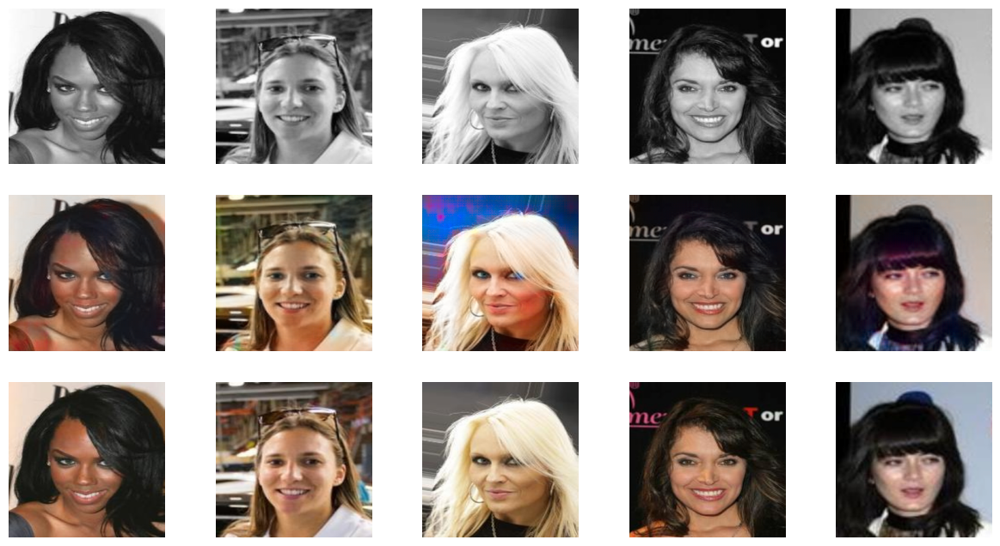

100%|█████████▉| 499/500 [06:30<00:00,  1.28it/s]


Epoch 8/20
Iteration 500/500
loss_D_fake: 0.56564
loss_D_real: 0.62122
loss_D: 0.59343
loss_G_GAN: 1.08916
loss_G_L1: 7.10778
loss_G: 8.19694


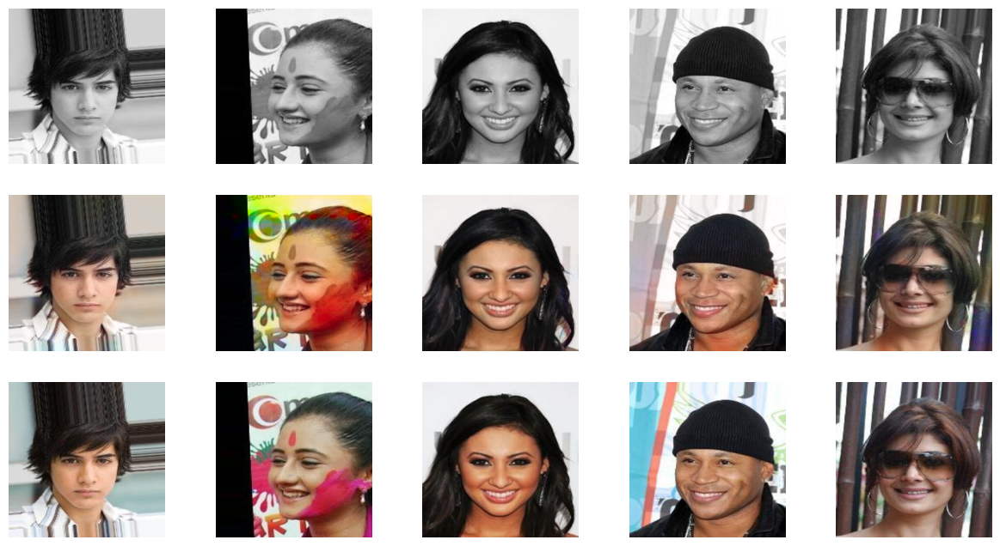

100%|█████████▉| 499/500 [06:28<00:00,  1.28it/s]


Epoch 9/20
Iteration 500/500
loss_D_fake: 0.56797
loss_D_real: 0.62883
loss_D: 0.59840
loss_G_GAN: 1.07961
loss_G_L1: 6.95943
loss_G: 8.03904


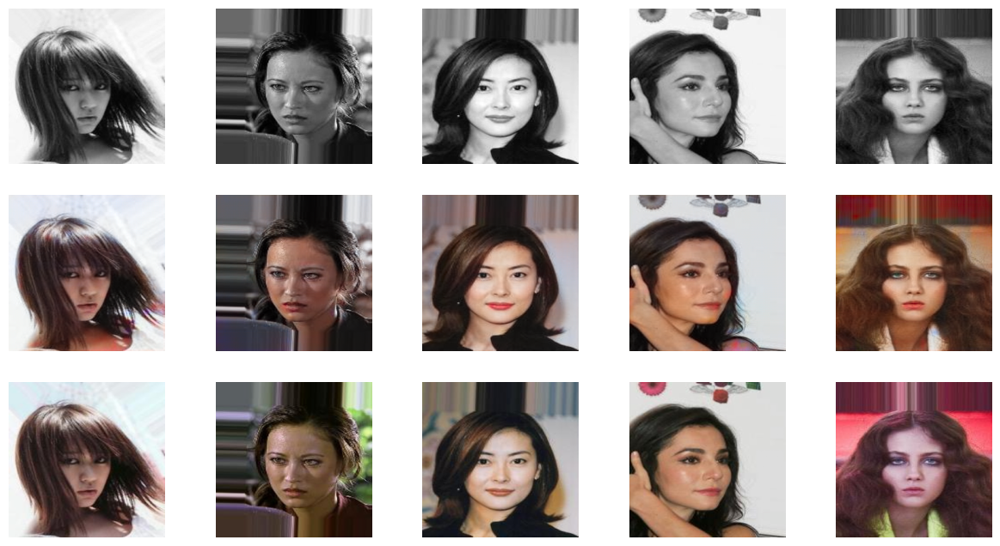

100%|█████████▉| 499/500 [06:28<00:00,  1.29it/s]


Epoch 10/20
Iteration 500/500
loss_D_fake: 0.57343
loss_D_real: 0.63017
loss_D: 0.60180
loss_G_GAN: 1.05767
loss_G_L1: 6.75150
loss_G: 7.80916


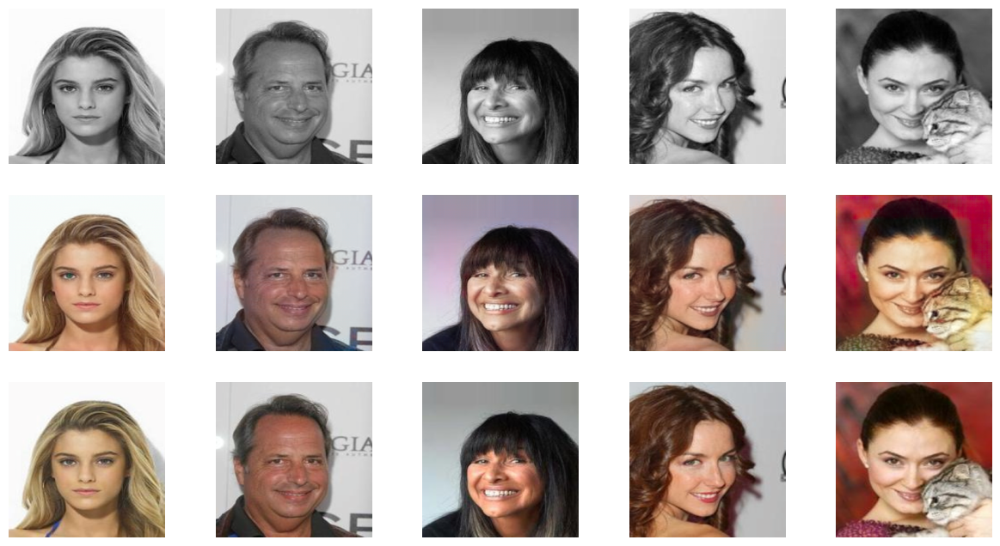

100%|█████████▉| 499/500 [06:30<00:00,  1.28it/s]


Epoch 11/20
Iteration 500/500
loss_D_fake: 0.57837
loss_D_real: 0.62960
loss_D: 0.60398
loss_G_GAN: 1.03765
loss_G_L1: 6.56340
loss_G: 7.60105


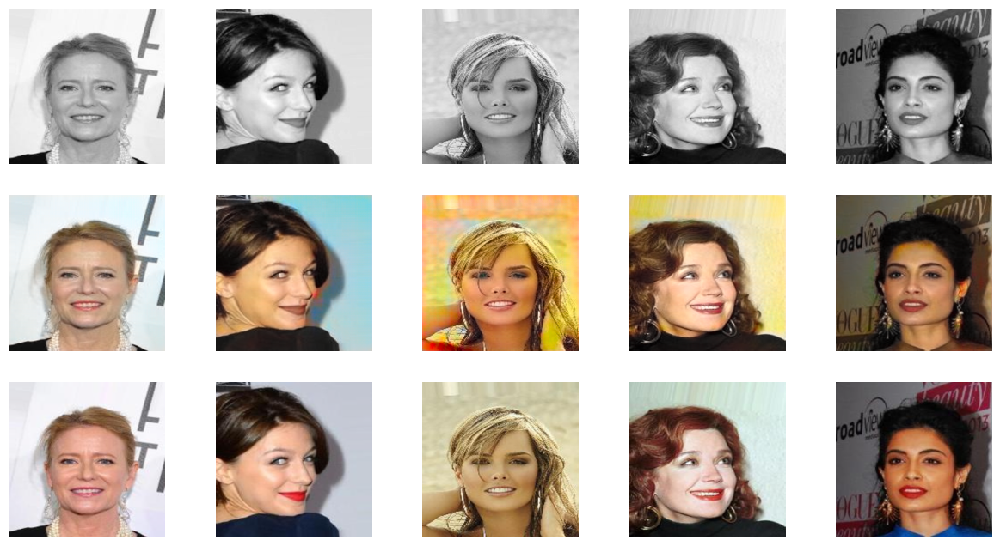

100%|█████████▉| 499/500 [06:28<00:00,  1.26it/s]


Epoch 12/20
Iteration 500/500
loss_D_fake: 0.59063
loss_D_real: 0.63754
loss_D: 0.61409
loss_G_GAN: 1.01632
loss_G_L1: 6.37416
loss_G: 7.39048


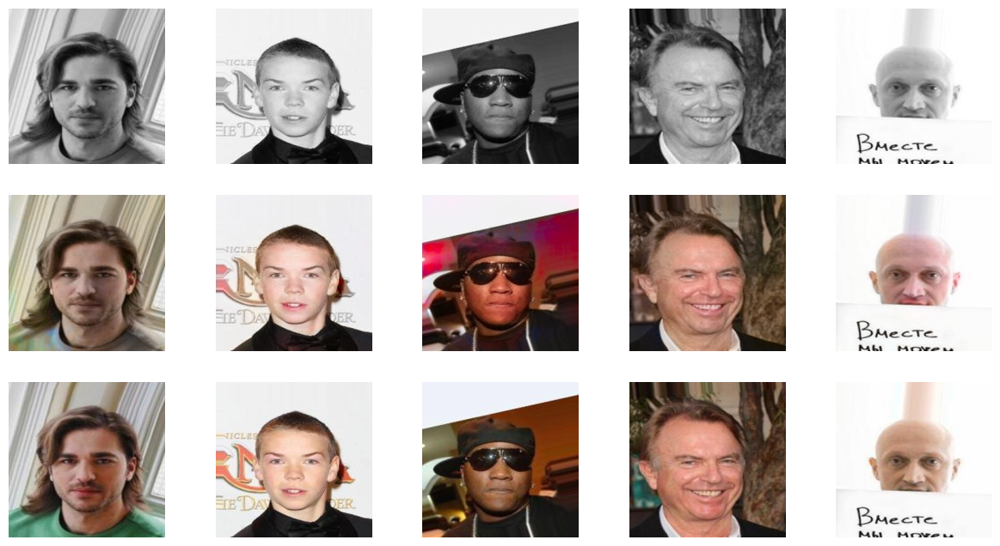

100%|█████████▉| 499/500 [06:30<00:00,  1.27it/s]


Epoch 13/20
Iteration 500/500
loss_D_fake: 0.59087
loss_D_real: 0.63780
loss_D: 0.61433
loss_G_GAN: 1.01126
loss_G_L1: 6.16048
loss_G: 7.17174


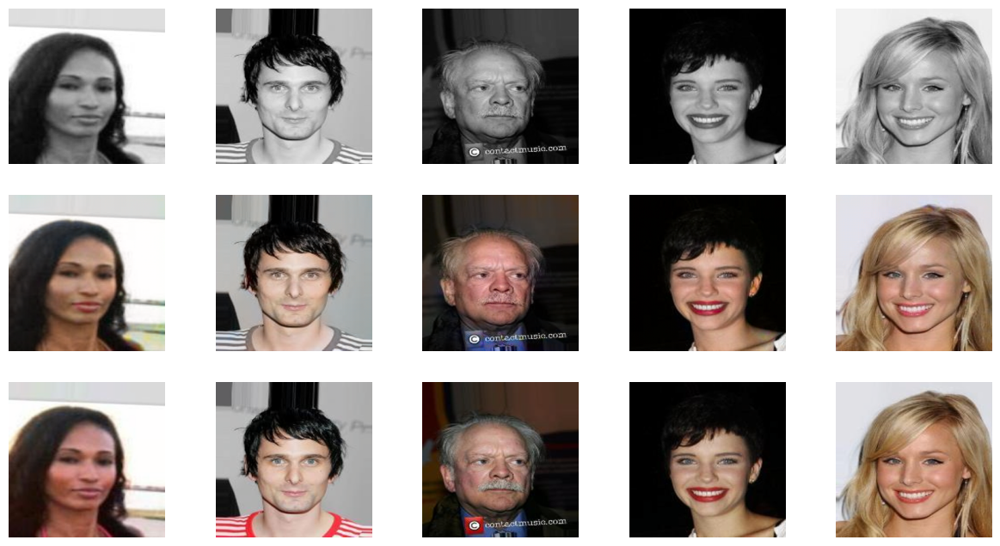

100%|█████████▉| 499/500 [06:31<00:00,  1.29it/s]


Epoch 14/20
Iteration 500/500
loss_D_fake: 0.59767
loss_D_real: 0.63811
loss_D: 0.61789
loss_G_GAN: 0.98187
loss_G_L1: 5.94912
loss_G: 6.93099


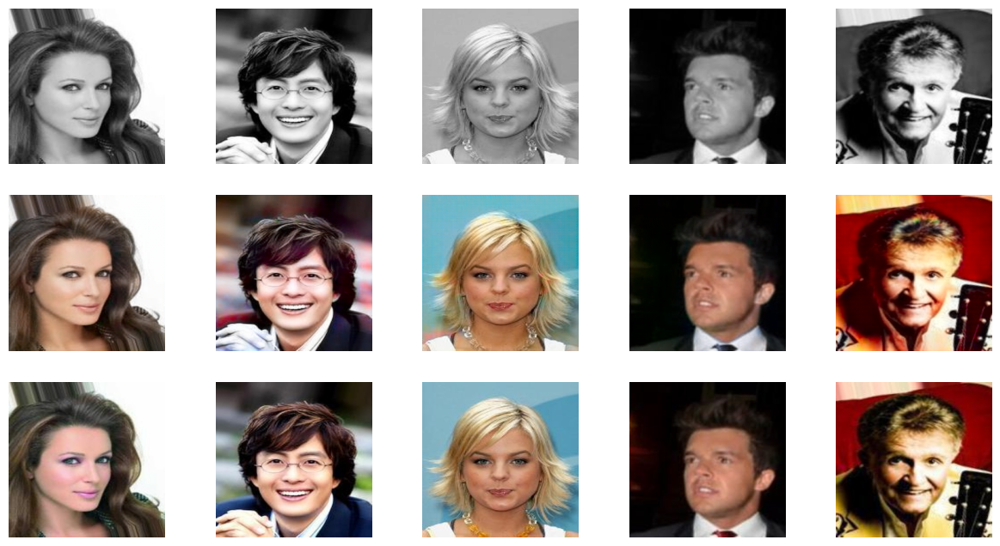

100%|█████████▉| 499/500 [06:30<00:00,  1.27it/s]


Epoch 15/20
Iteration 500/500
loss_D_fake: 0.60225
loss_D_real: 0.63998
loss_D: 0.62111
loss_G_GAN: 0.96746
loss_G_L1: 5.77357
loss_G: 6.74103


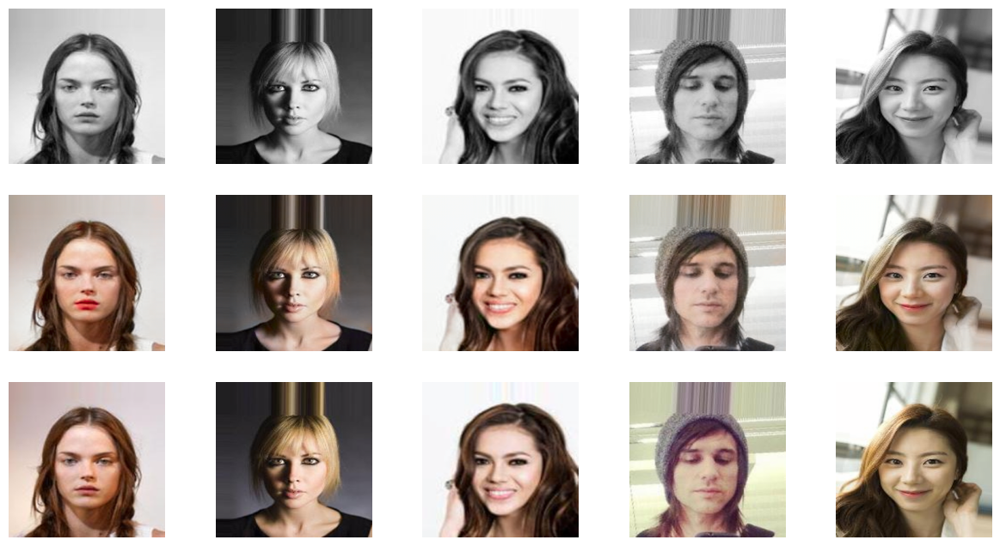

100%|█████████▉| 499/500 [06:30<00:00,  1.28it/s]


Epoch 16/20
Iteration 500/500
loss_D_fake: 0.60391
loss_D_real: 0.64154
loss_D: 0.62272
loss_G_GAN: 0.96648
loss_G_L1: 5.56107
loss_G: 6.52755


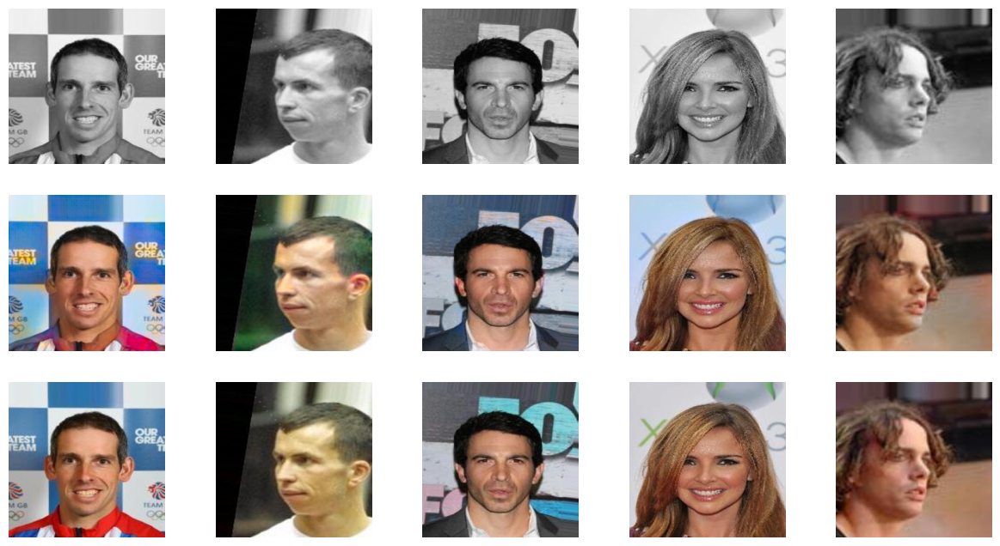

100%|█████████▉| 499/500 [06:29<00:00,  1.25it/s]


Epoch 17/20
Iteration 500/500
loss_D_fake: 0.61007
loss_D_real: 0.64760
loss_D: 0.62884
loss_G_GAN: 0.95456
loss_G_L1: 5.38912
loss_G: 6.34368


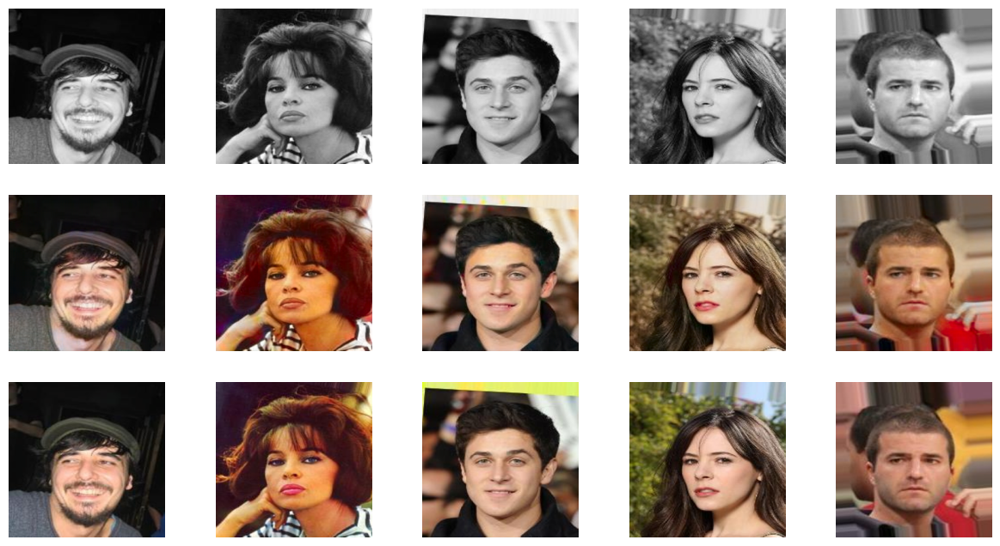

100%|█████████▉| 499/500 [06:28<00:00,  1.29it/s]


Epoch 18/20
Iteration 500/500
loss_D_fake: 0.61070
loss_D_real: 0.64141
loss_D: 0.62605
loss_G_GAN: 0.93398
loss_G_L1: 5.18311
loss_G: 6.11709


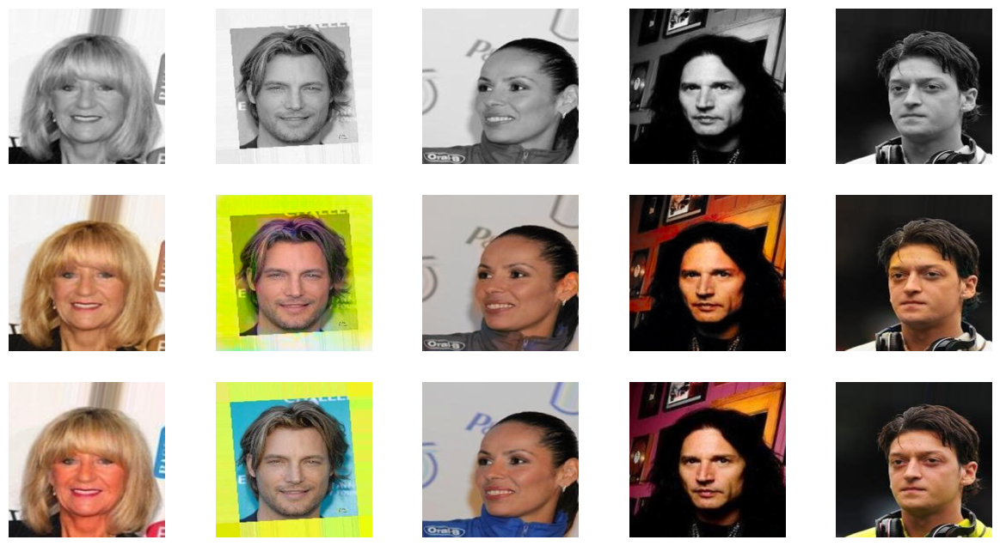

100%|█████████▉| 499/500 [06:29<00:00,  1.28it/s]


Epoch 19/20
Iteration 500/500
loss_D_fake: 0.61800
loss_D_real: 0.64711
loss_D: 0.63256
loss_G_GAN: 0.92178
loss_G_L1: 5.03429
loss_G: 5.95607


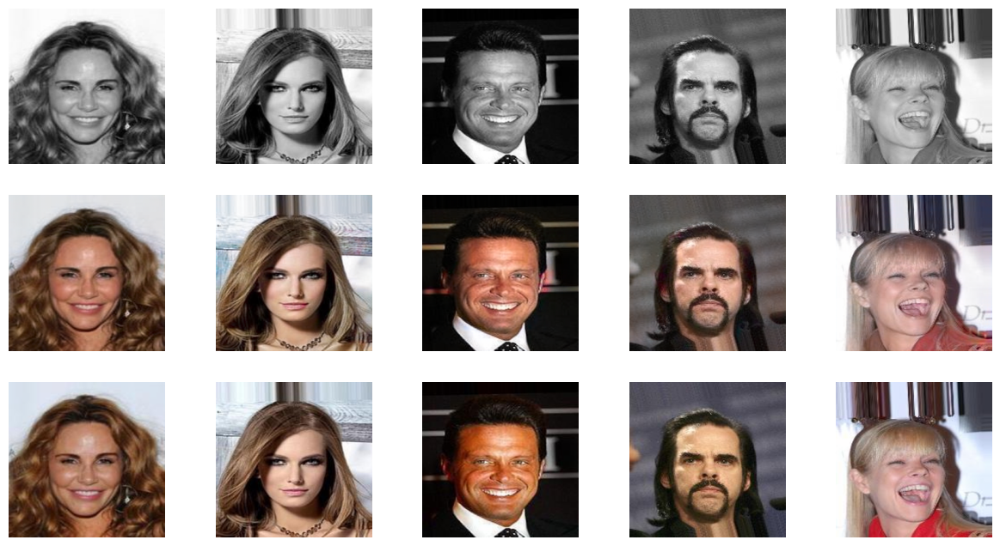

100%|█████████▉| 499/500 [06:28<00:00,  1.30it/s]


Epoch 20/20
Iteration 500/500
loss_D_fake: 0.61913
loss_D_real: 0.64791
loss_D: 0.63352
loss_G_GAN: 0.92249
loss_G_L1: 4.88508
loss_G: 5.80756


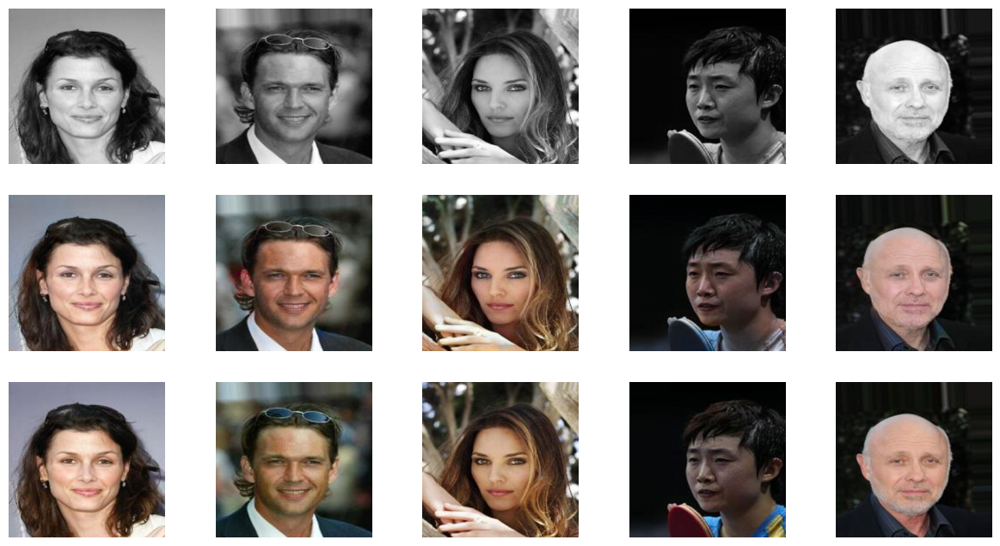

100%|██████████| 500/500 [06:30<00:00,  1.28it/s]


In [22]:
model = MainModel()
train_model(model, train_loader, 20)

In [23]:
torch.save(model, "main_model_full.pth") 